# Task B: Named Entity Recognition with CRF on Hindi Dataset. (Total: 60 Points out of 100)

In this part, you will use a CRF to implement a named entity recognition tagger.
We have implemented a CRF for you in crf.py along with some functions to build, and pad feature vectors. Your job is to add more features to learn a better tagger. Then you need to complete the traiing loop implementation.

Finally, you can checkout the code in `crf.py` -- reflect on CRFs and span tagging, and answer the discussion questions.


We will use the Hindi NER dataset at: https://github.com/cfiltnlp/HiNER

The first step would be to download the repo into your current folder of the Notebook

In [6]:
!git clone https://github.com/cfiltnlp/HiNER.git

fatal: destination path 'HiNER' already exists and is not an empty directory.


In [1]:
import torch

In [2]:
# This is so that you don't have to restart the kernel everytime you edit hmm.py

%load_ext autoreload
%autoreload 2

## First we load the data and labels. Feel free to explore them below.

Since we have provided a seperate train and dev split, there is not need to split the data yourself.

In [3]:
from crf import load_data, make_labels2i # type: ignore

train_filepath = "./HiNER/data/collapsed/train.conll"
dev_filepath = "./HiNER/data/collapsed/validation.conll"
labels_filepath = "./HiNER/data/collapsed/label_list"

train_sents, train_tag_sents = load_data(train_filepath)
dev_sents, dev_tag_sents = load_data(dev_filepath)
labels2i = make_labels2i(labels_filepath)

print("train sample", train_sents[2], train_tag_sents[2])
print()
print("labels2i", labels2i)

train sample ['रामनगर', 'इगलास', ',', 'अलीगढ़', ',', 'उत्तर', 'प्रदेश', 'स्थित', 'एक', 'गाँव', 'है।'] ['B-LOCATION', 'B-LOCATION', 'O', 'B-LOCATION', 'O', 'B-LOCATION', 'I-LOCATION', 'O', 'O', 'O', 'O']

labels2i {'<PAD>': 0, 'B-LOCATION': 1, 'B-ORGANIZATION': 2, 'B-PERSON': 3, 'I-LOCATION': 4, 'I-ORGANIZATION': 5, 'I-PERSON': 6, 'O': 7}


## Feature engineering. (Total 30 points)

Notice that we are **learning** features to some extent: we start with one unique feature for every possible word. You can refer to figure 8.15 in the textbook for some good baseline features to try.
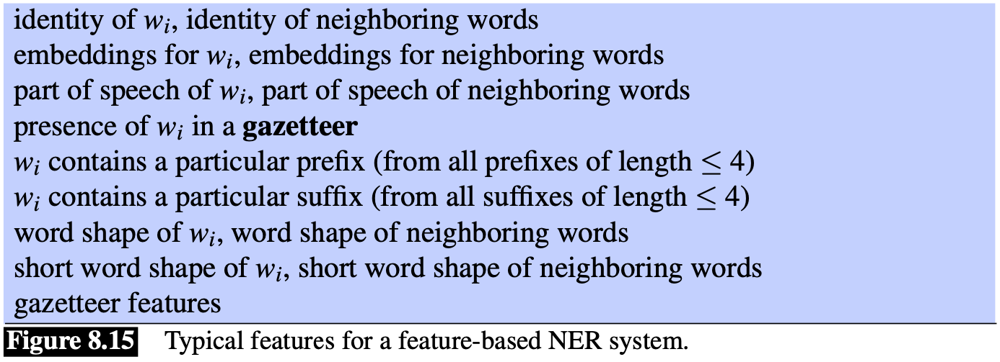

There is no need to worry about embeddings now.

### Hindi POS Tagger   (10 Points)

Although this step is not entirely necessary, if you want to use the HMM pos tagger to extract feature corresponding to the pos of the word in the sentence, we need to add this into the pipeline.

You get 10 points if you use your pos_tagger to featurize the sentences

In [4]:
from hmm import get_hindi_dataset
import pickle
from typing import List

words, tags, observation_dict, state_dict, all_observation_ids, all_state_ids = get_hindi_dataset()

# we need to add the id for unknown word (<unk>) in our observations vocab
UNK_TOKEN = '<unk>'

observation_dict[UNK_TOKEN] = len(observation_dict)
print("id of the <unk> token:", observation_dict[UNK_TOKEN])

## load the pos tagger 
pos_tagger = pickle.load(open('hindi_pos_tagger.pkl', 'rb'))

def encode(sentences: List[List[str]]) -> List[List[int]]:
    """
    Using the observation_dict, convert the tokens to ids
    unknown words take the id for UNK_TOKEN
    """
    return [
        [observation_dict[t] if t in observation_dict else observation_dict[UNK_TOKEN]
            for t in sentence]
        for sentence in sentences]

def get_pos(pos_tagger, sentences) -> List[List[str]]:
    """
    The the pos tag for input sentences
    """
    sentence_ids = encode(sentences)
    decoded_pos_ids = pos_tagger.decode(sentence_ids)
    return [
        [tags[i] for i in d_ids]
        for d_ids in decoded_pos_ids
    ]

id of the <unk> token: 2186


[nltk_data] Error loading indian: <urlopen error [Errno 8] nodename
[nltk_data]     nor servname provided, or not known>


### Feature Engineering Functions (20 Points)

In [9]:
# TODO: Update this function to add more features
#      You can check crf.py for how they are encoded, if interested.
def make_features(text: List[str]) -> List[List[int]]:
    """Turn a text into a feature vector.

    Args:
        text (List[str]): List of tokens.

    Returns:
        List[List[int]]: List of feature Lists.
    """
    feature_lists = []
    for i, token in enumerate(text):
        feats = []
        # We add a feature for each unigram.
        feats.append(f"word={token}")
        if i == 0:
            feats.append(f"prev_word=<S>")
        elif i > 0:
            prev_token = text[i-1]
            feats.append(f"prev_word={prev_token}")
        # TODO: Add more features here
        # pos = get_pos(pos_tagger, token)
        # flat_pos = [item for sublist in pos for item in sublist]
        # feats.append(f"pos={flat_pos}")
        # We append each feature to a List for the token.
        feature_lists.append(feats)

    return feature_lists

In [10]:
l = ['I','am','a','student','at','CU','Boulder']
make_features(l)
# train_sents[0]
# l2 = get_pos(pos_tagger, train_sents[0])
# flat_l = [item for sublist in l2 for item in sublist]
# train_sents[0][0]
# flat_l

[['word=I', 'prev_word=<S>'],
 ['word=am', 'prev_word=I'],
 ['word=a', 'prev_word=am'],
 ['word=student', 'prev_word=a'],
 ['word=at', 'prev_word=student'],
 ['word=CU', 'prev_word=at'],
 ['word=Boulder', 'prev_word=CU']]

In [60]:
def featurize(sents: List[List[str]]) -> List[List[List[str]]]:
    """Turn the sentences into feature Lists.
    
    Eg.: For an input of 1 sentence:
         [[['I','am','a','student','at','CU','Boulder']]]
        Return list of features for every token for every sentence like:
        [[
         ['word=I',  'prev_word=<S>','pos=PRON',...],
         ['word=am', 'prev_word=I'  , 'pos=VB' ,...],
         [...]
        ]]

    Args:
        sents (List[List[str]]): A List of sentences, which are Lists of tokens.

    Returns:
        List[List[List[str]]]: A List of sentences, which are Lists of feature Lists
    """
    feats = []
    count = 0
    for sent in sents:
        # Gets a List of Lists of feature strings
        # temp = make_features(sent)
        # print("sent", sent)
        # print("length", len(sent))
        # print("make features ", make_features(sent))
        features = make_features(sent)
        sent_tags = get_pos(pos_tagger, [sent])[0]
        for i, v in enumerate(sent_tags):
            features[i].append(f"pos={v}") # type: ignore
        feats.append(features)
        # print("features: ", features)
        # TO DO: Get pos tags
        
        # print("sent tags: ", sent_tags)
        # print("sent tag", len(sent_tags))
        # temp.append(f"pos={sent_tags}") # type: ignore
        # feats.append(temp)
        # print(sent_tags)
        # count +=1 
        # if count > 10:
        #     break

    return feats

In [61]:
# featurize(train_sents[0])
# l = ['देर', 'रात', 'तक', 'जुहू', 'चौपाटी', 'में', 'यह', 'नजारा', 'आम', 'है', '।']
# t = get_pos(pos_tagger, l)
# b = get_pos(pos_tagger, [l])
# c = get_pos(pos_tagger, [l])[0]
# print("t", t)
# print("b", b)
# print("c", c)
print(len(featurize(train_sents)))
print(featurize(train_sents))

Traceback (most recent call last):
  File "/Users/tylercranmer/Dev/CSCI/Grad/NLP/NLP_2023/venv/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/8l/21c6qx3d1kx_wxpsc0n2_qdw0000gn/T/ipykernel_50122/3782931288.py", line 9, in <module>
    print(len(featurize(train_sents)))
              ^^^^^^^^^^^^^^^^^^^^^^
  File "/var/folders/8l/21c6qx3d1kx_wxpsc0n2_qdw0000gn/T/ipykernel_50122/2788220133.py", line 28, in featurize
    sent_tags = get_pos(pos_tagger, [sent])[0]
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/var/folders/8l/21c6qx3d1kx_wxpsc0n2_qdw0000gn/T/ipykernel_50122/2841450901.py", line 31, in get_pos
    decoded_pos_ids = pos_tagger.decode(sentence_ids)
                      ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/tylercranmer/Dev/CSCI/Grad/NLP/NLP_2023/pos/hmm.py", line -1, in decode
KeyboardInterrupt

During handling of the above exception, another except

## Finish the training loop.   (10 Points)

See the previous homework, and fill in the missing parts of the training loop.

In [72]:
from crf import f1_score, predict, PAD_SYMBOL # type: ignore
import random

from tqdm import tqdm

from crf import pad_features, pad_labels  # type: ignore
# TODO: Implement the training loop

# HINT: Build upon what we gave you for HW2.

# See cell below for how we call this training loop.

def training_loop(
    num_epochs,
    batch_size,
    train_features,
    train_labels,
    dev_features,
    dev_labels,
    optimizer,
    model,
    labels2i,
    pad_feature_idx
):
    # raise NotImplementedError
    # TODO: Zip the train features and labels
    samples = list(zip(train_features, train_labels))
    # TODO: Randomize them, while keeping them paired.
    random.shuffle(samples)
    # TODO: Build batches
    batches = []
    # batches = [samples[i:i + batch_size] for i in range(0, len(samples), batch_size)]
    for i in range(0, len(samples), batch_size):
        batches.append(samples[i:i+batch_size])
    print("Training...")
    for i in range(num_epochs):
        losses = []
        for batch in tqdm(batches):
            # Here we get the features and labels, pad them,
            # and build a mask so that our model ignores PADs
            # We have abstracted the padding from you for simplicity, 
            # but please reach out if you'd like learn more.
            features, labels = zip(*batch)
            features = pad_features(features, pad_feature_idx)
            features = torch.stack(features)
            # Pad the label sequences to all be the same size, so we
            # can form a proper matrix.
            labels = pad_labels(labels, labels2i[PAD_SYMBOL])
            labels = torch.stack(labels)
            mask = (labels != labels2i[PAD_SYMBOL])
            # TODO: Empty the dynamic computation graph
            optimizer.zero_grad()

            # TODO: Run the model. Since we use the pytorch-crf model,
            # our forward function returns the positive log-likelihood already.
            # We want the negative log-likelihood. See crf.py forward method in NERTagger

            log_likelihood = model.forward(features, labels, mask)
            log_likelihood = log_likelihood * -1

            # TODO: Backpropogate the loss through our model
            log_likelihood.backward()
            
    
            # TODO: Update our coefficients in the direction of the gradient.
            optimizer.step()
            # TODO: Store the losses for logging
            losses.append(log_likelihood.item())
            # TODO: Log the average Loss for the epoch

    # TODO: make dev predictions with the `predict()` function
        pred = predict(model, dev_features)
    # TODO: Compute F1 score on the dev set and log it.
        f1 = f1_score(pred, dev_labels, 2186)
        print(f"Epoch {i+1}/{num_epochs}")
        print(f"Dev F1 Score: {f1[0]}")
        print(f"avg loss: {sum(losses)/len(losses)}\n")
 
    # Return the trained model
    return model

## Run the training loop   (10 Points)

We have provided the code here, but you can try different hyperparameters and test multiple runs.

In [64]:
train_features = featurize(train_sents)
dev_features = featurize(dev_sents)

In [73]:
from crf import build_features_set # type: ignore
from crf import make_features_dict # type: ignore
from crf import encode_features, encode_labels # type: ignore
from crf import NERTagger # type: ignore

# Build the model and featurized data

# Get the full inventory of possible features
all_features = build_features_set(train_features)
# Hash all features to a unique int.
features_dict = make_features_dict(all_features)
# Initialize the model.
model = NERTagger(len(features_dict), len(labels2i))

encoded_train_features = encode_features(train_features, features_dict)
encoded_dev_features = encode_features(dev_features, features_dict)
encoded_train_labels = encode_labels(train_tag_sents, labels2i)
encoded_dev_labels = encode_labels(dev_tag_sents, labels2i)

# TODO: Play with hyperparameters here.
num_epochs = 30
batch_size = 16
LR=0.05
optimizer = torch.optim.SGD(model.parameters(), LR)

model = training_loop(
    num_epochs,
    batch_size,
    encoded_train_features,
    encoded_train_labels,
    encoded_dev_features,
    encoded_dev_labels,
    optimizer,
    model,
    labels2i,
    features_dict[PAD_SYMBOL]
)

Building features set!


100%|██████████| 75827/75827 [00:00<00:00, 105460.55it/s]


Found 151827 features
Training...


100%|██████████| 4740/4740 [01:10<00:00, 66.79it/s]


Epoch 0/30 - Dev F1 Score: 0.890633225440979

epoch 0, avg loss: 7.225796474032261
Dev F1 tensor([0.8906])


100%|██████████| 4740/4740 [01:10<00:00, 66.97it/s]


Epoch 1/30 - Dev F1 Score: 0.9039161205291748

epoch 1, avg loss: 5.393498501848068
Dev F1 tensor([0.9039])


100%|██████████| 4740/4740 [01:10<00:00, 66.83it/s]


Epoch 2/30 - Dev F1 Score: 0.9128150939941406

epoch 2, avg loss: 4.756370960735571
Dev F1 tensor([0.9128])


100%|██████████| 4740/4740 [01:10<00:00, 67.55it/s]


Epoch 3/30 - Dev F1 Score: 0.9184160232543945

epoch 3, avg loss: 4.358403696893137
Dev F1 tensor([0.9184])


100%|██████████| 4740/4740 [01:03<00:00, 74.33it/s]


Epoch 4/30 - Dev F1 Score: 0.9229491949081421

epoch 4, avg loss: 4.07173381872821
Dev F1 tensor([0.9229])


100%|██████████| 4740/4740 [01:06<00:00, 71.17it/s]


Epoch 5/30 - Dev F1 Score: 0.9264011383056641

epoch 5, avg loss: 3.8497158366416575
Dev F1 tensor([0.9264])


100%|██████████| 4740/4740 [01:10<00:00, 67.08it/s]


Epoch 6/30 - Dev F1 Score: 0.9293734431266785

epoch 6, avg loss: 3.670105061475738
Dev F1 tensor([0.9294])


100%|██████████| 4740/4740 [01:11<00:00, 66.36it/s]


Epoch 7/30 - Dev F1 Score: 0.9316310286521912

epoch 7, avg loss: 3.5204131048439926
Dev F1 tensor([0.9316])


100%|██████████| 4740/4740 [01:11<00:00, 66.20it/s]


Epoch 8/30 - Dev F1 Score: 0.9339066743850708

epoch 8, avg loss: 3.392884023179485
Dev F1 tensor([0.9339])


100%|██████████| 4740/4740 [01:11<00:00, 65.89it/s]


Epoch 9/30 - Dev F1 Score: 0.9355806112289429

epoch 9, avg loss: 3.282370001857291
Dev F1 tensor([0.9356])


100%|██████████| 4740/4740 [01:11<00:00, 66.57it/s]


Epoch 10/30 - Dev F1 Score: 0.9371549487113953

epoch 10, avg loss: 3.1852809349444344
Dev F1 tensor([0.9372])


100%|██████████| 4740/4740 [01:10<00:00, 66.90it/s]


Epoch 11/30 - Dev F1 Score: 0.9387158751487732

epoch 11, avg loss: 3.0990128072379513
Dev F1 tensor([0.9387])


100%|██████████| 4740/4740 [01:12<00:00, 65.58it/s]


Epoch 12/30 - Dev F1 Score: 0.9403943419456482

epoch 12, avg loss: 3.0216232275283788
Dev F1 tensor([0.9404])


100%|██████████| 4740/4740 [01:12<00:00, 65.69it/s]


Epoch 13/30 - Dev F1 Score: 0.9413941502571106

epoch 13, avg loss: 2.9516288883072415
Dev F1 tensor([0.9414])


100%|██████████| 4740/4740 [01:09<00:00, 67.99it/s]


Epoch 14/30 - Dev F1 Score: 0.9422718286514282

epoch 14, avg loss: 2.8878756981735996
Dev F1 tensor([0.9423])


100%|██████████| 4740/4740 [01:11<00:00, 66.76it/s]


Epoch 15/30 - Dev F1 Score: 0.9431947469711304

epoch 15, avg loss: 2.8294493021215565
Dev F1 tensor([0.9432])


100%|██████████| 4740/4740 [01:11<00:00, 66.65it/s]


Epoch 16/30 - Dev F1 Score: 0.9441674947738647

epoch 16, avg loss: 2.775614643210097
Dev F1 tensor([0.9442])


100%|██████████| 4740/4740 [01:11<00:00, 66.71it/s]


Epoch 17/30 - Dev F1 Score: 0.9451039433479309

epoch 17, avg loss: 2.7257706803988806
Dev F1 tensor([0.9451])


100%|██████████| 4740/4740 [01:11<00:00, 66.73it/s]


Epoch 18/30 - Dev F1 Score: 0.945827841758728

epoch 18, avg loss: 2.679421303103745
Dev F1 tensor([0.9458])


100%|██████████| 4740/4740 [01:11<00:00, 66.73it/s]


Epoch 19/30 - Dev F1 Score: 0.94649738073349

epoch 19, avg loss: 2.636152107755846
Dev F1 tensor([0.9465])


100%|██████████| 4740/4740 [01:11<00:00, 66.60it/s]


Epoch 20/30 - Dev F1 Score: 0.947135329246521

epoch 20, avg loss: 2.5956147310728763
Dev F1 tensor([0.9471])


100%|██████████| 4740/4740 [01:10<00:00, 66.97it/s]


Epoch 21/30 - Dev F1 Score: 0.9477596282958984

epoch 21, avg loss: 2.557512707662482
Dev F1 tensor([0.9478])


100%|██████████| 4740/4740 [01:10<00:00, 67.07it/s]


Epoch 22/30 - Dev F1 Score: 0.9484337568283081

epoch 22, avg loss: 2.5215937226884977
Dev F1 tensor([0.9484])


100%|██████████| 4740/4740 [01:11<00:00, 65.96it/s]


Epoch 23/30 - Dev F1 Score: 0.9490264058113098

epoch 23, avg loss: 2.48764163465691
Dev F1 tensor([0.9490])


100%|██████████| 4740/4740 [01:11<00:00, 66.24it/s]


Epoch 24/30 - Dev F1 Score: 0.9496960043907166

epoch 24, avg loss: 2.455468527890962
Dev F1 tensor([0.9497])


100%|██████████| 4740/4740 [01:12<00:00, 65.58it/s]


Epoch 25/30 - Dev F1 Score: 0.9500849843025208

epoch 25, avg loss: 2.4249119254858686
Dev F1 tensor([0.9501])


100%|██████████| 4740/4740 [01:11<00:00, 66.35it/s]


Epoch 26/30 - Dev F1 Score: 0.9504786729812622

epoch 26, avg loss: 2.395830115411855
Dev F1 tensor([0.9505])


100%|██████████| 4740/4740 [01:10<00:00, 67.31it/s]


Epoch 27/30 - Dev F1 Score: 0.9509627223014832

epoch 27, avg loss: 2.3680980731163346
Dev F1 tensor([0.9510])


100%|██████████| 4740/4740 [01:11<00:00, 66.21it/s]


Epoch 28/30 - Dev F1 Score: 0.9513608813285828

epoch 28, avg loss: 2.3416068507523478
Dev F1 tensor([0.9514])


100%|██████████| 4740/4740 [01:11<00:00, 66.51it/s]


Epoch 29/30 - Dev F1 Score: 0.9516775608062744

epoch 29, avg loss: 2.3162580658614886
Dev F1 tensor([0.9517])


## Quiz (10 Points)

### 1. Look at the `NERTagger` class in crf.py

    a) What does the CRF add to our model that makes it different from the sentiment classifier?
        - CRF adds a conditional random field (viterby tables) that allows for the model to learn the relationships between words in the sequence. 
        - The CRF will assign a label to each token in sequence while the sentiment classifier looks at the entire piece of text (i.e sentence or document).
        - CRF takes into account dependencies of the label and their adjacent tokens. This makes modeing for sequence labeling doable. 

    b) Why is this helpful for NER?
        - This is helpful for NER because the model is able to classify named entities into different categories such as a PERSON or LOCATION.

### 2. Why computing F1 here is not straightforward?

Hint: Refer to the class in which Jim went over the evaluation metrics for NER 

There could be an imbalance of POS classes. For example, there are more nouns and verbs than other POS tags. So the f1 score might be dominated by the performance of the most frequent tags. 